In [1]:
import librosa
import numpy as np
import soundfile as sf
from scipy.fftpack import dct, idct
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import os

y, sr = librosa.load("samples/sample.wav", sr=44100, mono=True)

print(f"Dlugość: {len(y)/sr:.2f} s")
print(f"n próbek: {len(y)}")
print(f"Rozmiar: {len(y)*4/1024:.2f} KB")  # 4 * probka

Dlugość: 29.98 s
n próbek: 1322253
Rozmiar: 5165.05 KB


In [2]:
display(Audio(y, rate=sr))
sf.write("samples/output_original.wav", y, sr)

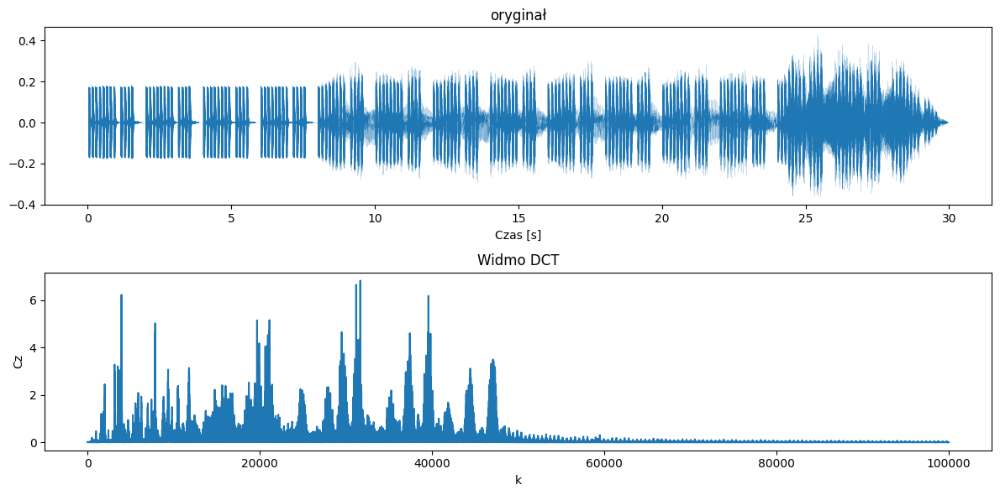

In [10]:
fig, axes = plt.subplots(2, 1, figsize=(12, 6))
axes[0].plot(np.linspace(0, len(y)/sr, len(y)), y, lw=0.1)
axes[0].set_title("oryginał")
axes[0].set_xlabel("Czas [s]")

C = dct(y, norm="ortho")
axes[1].plot(np.abs(C[:100000]))
axes[1].set_title("Widmo DCT")
axes[1].set_xlabel("k")
axes[1].set_ylabel("Cz")
plt.tight_layout()

In [13]:
def compress_dct_global(signal, k):
    C = dct(signal, norm="ortho")
    C_red = np.zeros_like(C)
    C_red[:k] = C[:k]
    return idct(C_red, norm="ortho")

Audio(compress_dct_global(y, 50000), rate=sr)

In [5]:
def compress_dct_frames(signal, frame_size, k):
    frames = signal[:len(signal) - len(signal) % frame_size]
    frames = frames.reshape(-1, frame_size)
    rec = []
    for frame in frames:
        C = dct(frame, norm="ortho")
        C[k:] = 0
        rec.append(idct(C, norm="ortho"))
    return np.array(rec).flatten()

frame_size = 512  # mp3 576

for k in [16, 32, 64, 128, 256]:
    rec = compress_dct_frames(y, frame_size, k)
    mse = np.mean((y[:len(rec)] - rec)**2)
    ratio = k / frame_size * 100
    print(f"k={k:3d}/{frame_size} ({ratio:.0f}%) | MSE={mse:.6f}")
    sf.write(f"outputs/dct/frames_k{k}.wav", rec.astype(np.float32), sr)

k= 16/512 (3%) | MSE=0.001098
k= 32/512 (6%) | MSE=0.000006
k= 64/512 (12%) | MSE=0.000001
k=128/512 (25%) | MSE=0.000000
k=256/512 (50%) | MSE=0.000000


In [6]:
def compress_pca(signal, frame_size, k):
    frames = signal[:len(signal) - len(signal) % frame_size]
    frames = frames.reshape(-1, frame_size)
    mean = np.mean(frames, axis=0)
    Xc = frames - mean
    _, S, Vt = np.linalg.svd(Xc, full_matrices=False)
    W = Vt.T[:, :k]
    Z = Xc @ W
    return (Z @ W.T + mean).flatten(), S

frame_size = 512
n_frames = len(y) // frame_size

for k in [4, 8, 16, 32, 64]:
    rec, S = compress_pca(y, frame_size, k)
    # koszt: k wektorów bazowych (k*512) + projekcje (k*n_ramek)
    params = k * (frame_size + n_frames)
    sf.write(f"outputs/pca/frames_k{k}.wav", rec.astype(np.float32), sr)
    print(f"k={k:3d} | params={params:7d}")

k=  4 | params=  12376
k=  8 | params=  24752
k= 16 | params=  49504
k= 32 | params=  99008
k= 64 | params= 198016


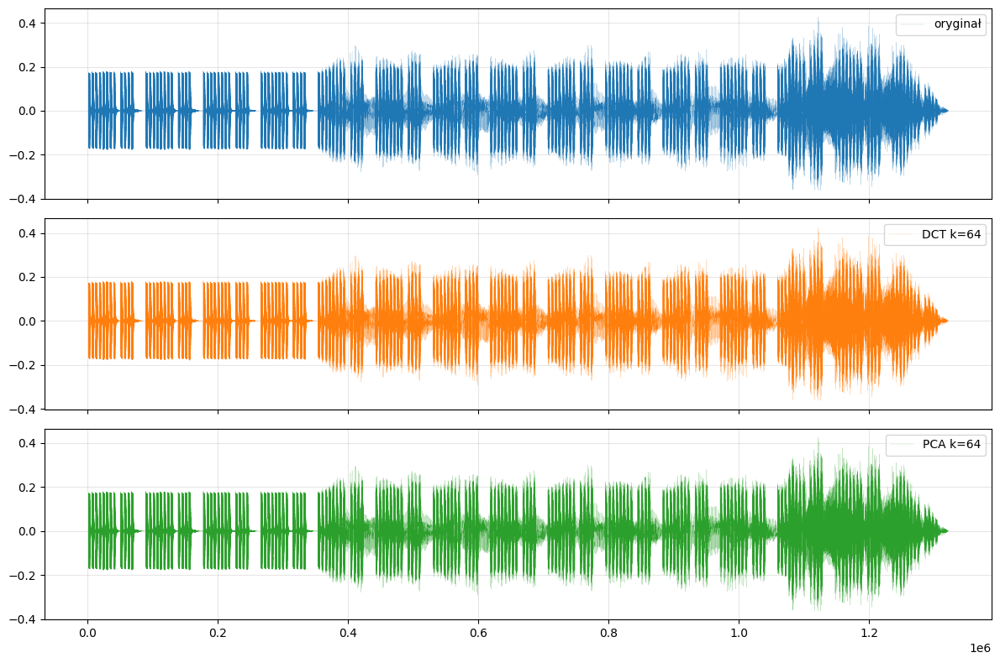

In [7]:
k_dct = 64
k_pca = 64

rec_dct = compress_dct_frames(y, 512, k_dct)
rec_pca, _ = compress_pca(y, 512, k_pca)
n = min(len(rec_dct), len(rec_pca), len(y))

fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True)
axes[0].plot(y[:n], lw=0.1, label="oryginał")
axes[1].plot(rec_dct[:n], lw=0.1, color='tab:orange', label=f"DCT k={k_dct}")
axes[2].plot(rec_pca[:n], lw=0.1, color='tab:green', label=f"PCA k={k_pca}")
for ax in axes:
    ax.legend(loc='upper right')
    ax.grid(True, alpha=0.3)
plt.tight_layout()


display(Audio(y, rate=sr))
display(Audio(rec_dct, rate=sr))
display(Audio(rec_pca, rate=sr))

DCT k=64/512 → 12.5% współczynników na ramkę → zakres 0–1378 Hz
PCA k=16 → 16 komponentów z max min(n_frames, 512) — ale koszt to 16×(n_frames+512) liczb, znacznie więcej niż DCT.

In [8]:
def save_compressed_dct_frames(signal, frame_size, k, path):
    frames = signal[:len(signal) - len(signal) % frame_size].reshape(-1, frame_size)
    coeffs = []
    for frame in frames:
        C = dct(frame, norm="ortho")
        coeffs.append(C[:k])
    np.savez_compressed(path,
        coeffs=np.array(coeffs).astype(np.float32),
        k=k,
        frame_size=frame_size,
        sr=sr
    )

def load_compressed_dct_frames(path):
    data = np.load(path)
    coeffs = data['coeffs']
    frame_size = int(data['frame_size'])
    sr = int(data['sr'])
    rec = []
    for c in coeffs:
        C = np.zeros(frame_size)
        C[:len(c)] = c
        rec.append(idct(C, norm="ortho"))
    return np.array(rec).flatten(), sr

def save_compressed_pca(signal, frame_size, k, path):
    frames = signal[:len(signal) - len(signal) % frame_size].reshape(-1, frame_size)
    mean = np.mean(frames, axis=0)
    Xc = frames - mean
    _, _, Vt = np.linalg.svd(Xc, full_matrices=False)
    W = Vt.T[:, :k]
    Z = Xc @ W
    np.savez_compressed(path,
        Z=Z.astype(np.float32),
        W=W.astype(np.float32),
        mean=mean.astype(np.float32),
        frame_size=frame_size,
        sr=sr
    )

def load_compressed_pca(path):
    data = np.load(path)
    Z, W, mean = data['Z'], data['W'], data['mean']
    frames = Z @ W.T + mean
    return frames.flatten(), int(data['sr'])

save_compressed_dct_frames(y, frame_size=512, k=64, path="compressed_dct_frames_k8")
save_compressed_pca(y, frame_size=512, k=64, path="compressed_pca_k8")

print(f"Oryginał WAV: {len(y)*4/1024:.1f} KB")
print(f"DCT ramkowa: {os.path.getsize('compressed_dct_frames_k8.npz')/1024:.1f} KB")
print(f"PCA: {os.path.getsize('compressed_pca_k8.npz')/1024:.1f} KB")

Oryginał WAV: 5165.1 KB
DCT ramkowa: 615.2 KB
PCA: 731.4 KB


Rekonstrukcja wraca do N próbek — WAV zawsze ma ten sam rozmiar niezależnie od k. Żeby faktycznie zmniejszyć plik trzeba zapisać same współczynniki (k liczb), nie zrekonstruowany sygnał. Własny format binarny (surowe bajty + nagłówek) też działa, ale wymaga dystrybucji dekodera — bez niego plik jest bezużyteczny. Stąd sens standardów takich jak MP3/AAC

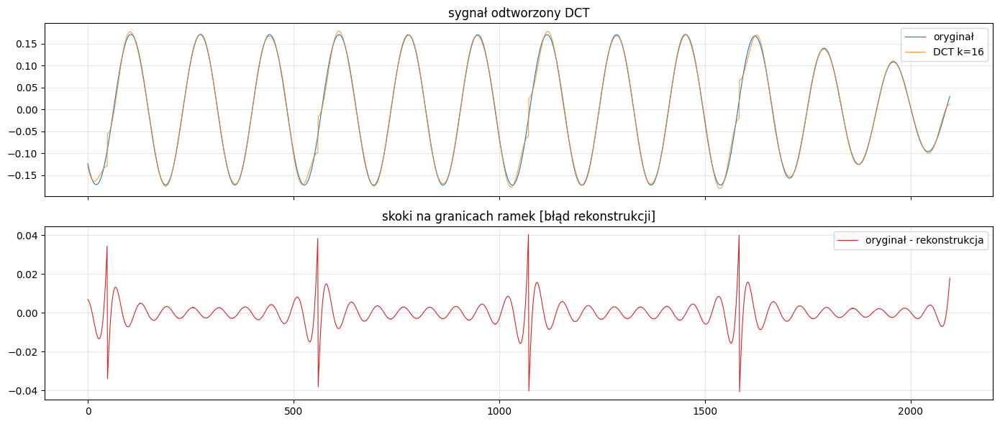

In [9]:
frame_size = 512
k = 16
n_ramek = 8
rec = compress_dct_frames(y, frame_size, k)
n = len(rec)

start = 2000
end = frame_size * n_ramek

fig, axes = plt.subplots(2, 1, figsize=(14, 6), sharex=True)

axes[0].plot(y[start:end], lw=0.8, label="oryginał")
axes[0].plot(rec[start:end], lw=0.8, label=f"DCT k={k}", alpha=0.8)
axes[0].legend()
axes[0].set_title("sygnał odtworzony DCT")
axes[0].grid(True, alpha=0.3)

error = y[start:end] - rec[start:end]
axes[1].plot(error, lw=0.8, color='tab:red', label="oryginał - rekonstrukcja")
axes[1].legend()
axes[1].set_title("skoki na granicach ramek [błąd rekonstrukcji]")
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()